In [24]:
!pip install segyio
!pip install segysak
!pip install patchify
!pip install segmentation_models_3D

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [25]:
import tensorflow as tf
import keras
print(tf.__version__)
print(keras.__version__)

2.9.2
2.9.0


In [26]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import segyio
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import segmentation_models_3D as sm
from patchify import patchify, unpatchify
# import Augment as a
# import Patchify as p
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers import Adam
from keras.models import load_model
from tqdm.auto import tqdm
from segysak.segy import segy_header_scan, segy_header_scrape, get_segy_texthead, segy_loader
from keras.metrics import MeanIoU
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from matplotlib.colors import LinearSegmentedColormap
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input, Add
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG19
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model



Segmentation Models: using `tf.keras` framework.


In [ ]:
# Normalization
def normalization(data, clip_factor=2.5):
  clipFactor = clip_factor
  std0 = np.std(data)
  stdClip = std0 * clipFactor
  clippedCube = np.clip(data, -stdClip, +stdClip)
  return np.asarray(clippedCube / stdClip, dtype='single')

## Dataset Preparation

In [32]:
seismic = segyio.tools.cube('/content/drive/MyDrive/UTP_dGB_Documents/data/3CH_Fault/seismic.segy').reshape(1200, 128, 128)
curvature = segyio.tools.cube('/content/drive/MyDrive/UTP_dGB_Documents/data/3CH_Fault/curvature.segy').reshape(1200, 128, 128)
chaos = segyio.tools.cube('/content/drive/MyDrive/UTP_dGB_Documents/data/3CH_Fault/chaos.segy').reshape(1200, 128, 128)
fault = np.reshape(np.fromfile('/content/drive/MyDrive/UTP_dGB_Documents/data/train/fault/1200.dat', dtype=np.single), (1200, 128, 128))

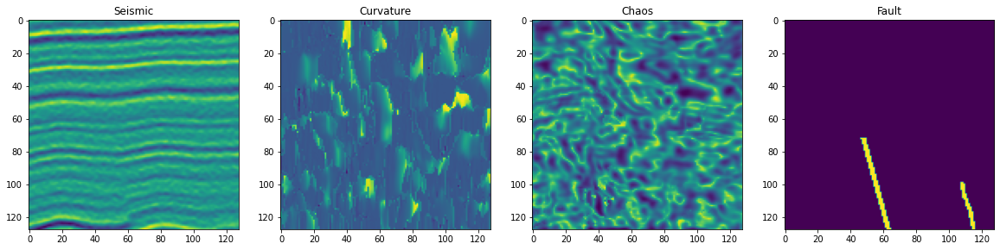

In [33]:
plt.figure(figsize=(20, 5))
plt.subplot(141)
plt.title('Seismic')
plt.imshow(seismic[10,:,:].T)
plt.subplot(142)
plt.title('Curvature')
plt.imshow(curvature[10,:,:].T)
plt.subplot(143)
plt.title('Chaos')
plt.imshow(chaos[10,:,:].T)
plt.subplot(144)
plt.title('Fault')
plt.imshow(fault[10,:,:].T);

## Train Test Split

In [ ]:
train_img = np.stack([seismic, curvature, chaos], axis=-1)
train_mask = np.expand_dims(fault, axis=3)
train_mask_cat = tf.keras.utils.to_categorical(train_mask, num_classes=2)
X_train, X_test, y_train, y_test = train_test_split(train_img, train_mask_cat, test_size = 0.10, random_state = 0)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1080, 128, 128, 3)
(120, 128, 128, 3)
(1080, 128, 128, 2)
(120, 128, 128, 2)


In [ ]:
X_train_norm = normalization(X_train)
X_test_norm = normalization(X_test)


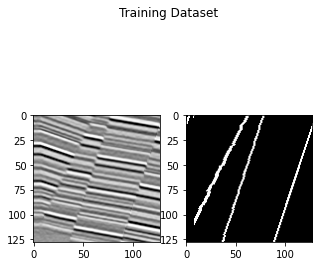

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(5,5))
ax[0].imshow(X_train_norm[1, :, :, 0].T, cmap='Greys')
ax[1].imshow(y_train[1, :, :, 1].T, cmap='Greys_r')
fig.suptitle('Training Dataset')
plt.show()


## Training

In [ ]:
batch_size = 8
image_size = 128

##### UNet VGG19

In [ ]:
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_vgg19_unet(input_shape, freeze=1):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained VGG19 Model """
    vgg19 = VGG19(include_top=False, weights="imagenet", input_tensor=inputs)
    
    """ 
        Select Freeze layer 
        VGG 19, consist of 22 trainable layers
        Freeze = True, all layers freeze not fine tune
        Freeze = False, all layers fine tune
        Freeze = 1, 1 last layers freeze
        Freeze = 21, 1 last layers fine tune, else freeze
    """

    if freeze == True:
      for layer in vgg19.layers:
        layer.trainable = False
    elif freeze == False:
      for layer in vgg19.layers[:]:
        layer.trainable = True
    elif freeze > 0:
      for layer in vgg19.layers[:freeze]:
        layer.trainable = False
    elif freeze < 0:
      # n_freeze = -1*freeze
      for layer in vgg19.layers[freeze:]:
        layer.trainable = False
    # else:
    #   for layer in vgg19.layers[:-1*freeze]:
    #     layer.trainable = False
    
    for layer in vgg19.layers:
      print(layer, layer.trainable)

    """ Encoder """
    s1 = vgg19.get_layer("block1_conv2").output         ## (512 x 512)
    s2 = vgg19.get_layer("block2_conv2").output         ## (256 x 256)
    s3 = vgg19.get_layer("block3_conv4").output         ## (128 x 128)
    s4 = vgg19.get_layer("block4_conv4").output         ## (64 x 64)

    """ Bridge """
    b1 = vgg19.get_layer("block5_conv4").output         ## (32 x 32)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)

    """ Output """
    outputs = Conv2D(2, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="VGG19_U-Net")
    return model

##### Model Training

In [ ]:
n_layers = [False, -11]
all_unet_vgg_models = []
history = []
for i,j in enumerate(n_layers):
  print(f'Scenario {i}')
  input_shape = (128,128, 3)
  model_unet_vgg = build_vgg19_unet(input_shape, freeze=j)
  model_unet_vgg.summary()
  model_unet_vgg.compile(optimizer="adam", loss="binary_crossentropy", metrics=["acc"])
  history.append(model_unet_vgg.fit(X_train_norm, 
                                    y_train,
                                    batch_size=8, 
                                    epochs=100,
                                    verbose=1,
                                    validation_data=(X_test_norm, y_test),))
                                    # callbacks=EarlyStopping(monitor='val_acc', mode='max',patience=10)))
  all_unet_vgg_models.append(model_unet_vgg)

Scenario 0
80134624/80134624 [==============================] - 4s 0us/step
<keras.engine.input_layer.InputLayer object at 0x7fe8fd8d0670> True
<keras.layers.convolutional.conv2d.Conv2D object at 0x7fe8fd8d0880> True
<keras.layers.convolutional.conv2d.Conv2D object at 0x7fe8fd8d0dc0> True
<keras.layers.pooling.max_pooling2d.MaxPooling2D object at 0x7fe8fd8d0cd0> True
<keras.layers.convolutional.conv2d.Conv2D object at 0x7fe8fd8edf10> True
<keras.layers.convolutional.conv2d.Conv2D object at 0x7fe8fd8dcdf0> True
<keras.layers.pooling.max_pooling2d.MaxPooling2D object at 0x7fe8fd8dc5e0> True
<keras.layers.convolutional.conv2d.Conv2D object at 0x7fe8fd8c4f70> True
<keras.layers.convolutional.conv2d.Conv2D object at 0x7fe8fd8e52b0> True
<keras.layers.convolutional.conv2d.Conv2D object at 0x7fe8f0322a30> True
<keras.layers.convolutional.conv2d.Conv2D object at 0x7fe8fd8e5310> True
<keras.layers.pooling.max_pooling2d.MaxPooling2D object at 0x7fe8fd8dc850> True
<keras.layers.convolutional.conv

In [ ]:
model_unet_vgg_1 = all_unet_vgg_models[0]
model_unet_vgg_2 = all_unet_vgg_models[1]

##### Model Evaluation

In [ ]:
history_1 = history[0]
history_2 = history[1]


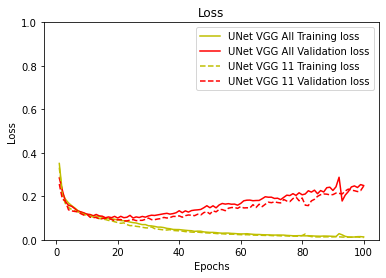

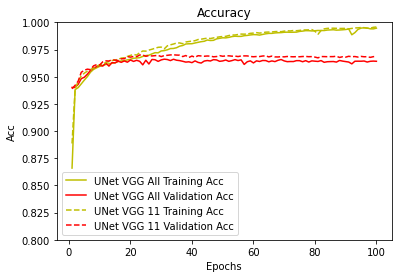

In [27]:
#plot the training and validation acc and loss at each epoch
loss_1 = history_1.history['loss']
val_loss_1 = history_1.history['val_loss']
epochs = range(1, len(loss_1) + 1)
plt.plot(epochs, loss_1, 'y-', label='UNet VGG All Training loss')
plt.plot(epochs, val_loss_1, 'r-', label='UNet VGG All Validation loss')
loss_2 = history_2.history['loss']
val_loss_2 = history_2.history['val_loss']
epochs = range(1, len(loss_2) + 1)
plt.plot(epochs, loss_2, 'y--', label='UNet VGG 11 Training loss')
plt.plot(epochs, val_loss_2, 'r--', label='UNet VGG 11 Validation loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim([0, 1])
plt.legend()
plt.show()

acc_1 = history_1.history['acc']
val_acc_1 = history_1.history['val_acc']
acc_2 = history_2.history['acc']
val_acc_2 = history_2.history['val_acc']
epochs = range(1, len(acc_1) + 1)
plt.plot(epochs, acc_1, 'y-', label='UNet VGG All Training Acc')
plt.plot(epochs, val_acc_1, 'r-', label='UNet VGG All Validation Acc')
epochs = range(1, len(acc_2) + 1)
plt.plot(epochs, acc_2, 'y--', label='UNet VGG 11 Training Acc')
plt.plot(epochs, val_acc_2, 'r--', label='UNet VGG 11 Validation Acc')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Acc')
plt.ylim([0.8, 1])
plt.legend()
plt.show()

##### Save Model

In [ ]:
model_unet_vgg_1.save('/content/drive/MyDrive/UTP_dGB_Documents/model/model_unet_vgg_trainable_channelized.h5')
model_unet_vgg_2.save('/content/drive/MyDrive/UTP_dGB_Documents/model/model_unet_vgg_11_last_layers_channelized.h5')


## Prediction

In [ ]:
model_unet_vgg_1 = load_model('/content/drive/MyDrive/UTP_dGB_Documents/model/model_unet_vgg_trainable_channelized.h5', compile=False)
model_unet_vgg_2 = load_model('/content/drive/MyDrive/UTP_dGB_Documents/model/model_unet_vgg_11_last_layers_channelized.h5', compile=False)

In [ ]:
ncolors = 256
color_array = plt.get_cmap('gray')(range(ncolors))
color_array[:,-1] = np.linspace(0.0,0,ncolors)
color_array[255:256] = [1, 0.0, 0., 1.0]
map_object = LinearSegmentedColormap.from_list(name='fault',colors=color_array)
plt.register_cmap(cmap=map_object)

In [ ]:
def predict_patch(seismic, model):
  n1=128
  n2=128  
  # Inline
  predicted_il = []
  for i in range(seismic.shape[0]):
    gx = seismic[i, :, :]
    m1, m2 = gx.shape
    os = 0 #overlap width
    c1 = np.round((m1+os)/(n1-os)+0.5)
    c2 = np.round((m2+os)/(n2-os)+0.5)
    c1 = int(c1)
    c2 = int(c2)
    p1 = (n1-os)*c1+os
    p2 = (n2-os)*c2+os
    gp = np.zeros((p1,p2),dtype=np.single)
    gy = np.zeros((p1,p2),dtype=np.single)
    gs = np.zeros((1,n1,n2,1),dtype=np.single)
    Y = np.zeros((1,n1,n2,1),dtype=np.single)
    gp[0:m1,0:m2]=gx
    for k1 in range(c1):
        for k2 in range(c2):
            b1 = k1*n1-k1*os
            e1 = b1+n1
            b2 = k2*n2-k2*os
            e2 = b2+n2
            gs[0,:,:,0]=gp[b1:e1,b2:e2]
            single_patch_3ch = np.stack((gs[0,:,:,0],)*3, axis=-1)
            single_patch_3ch_input = np.expand_dims(single_patch_3ch, axis=0)
            single_patch_prediction = model.predict(single_patch_3ch_input)
            Y[0,:,:,0] = np.argmax(single_patch_prediction, axis=3)[0,:,:]
            Y = np.array(Y)
            gy[b1:e1,b2:e2]= gy[b1:e1,b2:e2]+Y[0,:,:,0]
    gy = gy[0:m1,0:m2]
    predicted_il.append(gy.astype(int))
  predicted_il = np.array(predicted_il)
  # Crossline
  predicted_xl = []
  for j in range(seismic.shape[1]):
    gx = seismic[:, j, :]
    m1, m2 = gx.shape
    os = 0 #overlap width
    c1 = np.round((m1+os)/(n1-os)+0.5)
    c2 = np.round((m2+os)/(n2-os)+0.5)
    c1 = int(c1)
    c2 = int(c2)
    p1 = (n1-os)*c1+os
    p2 = (n2-os)*c2+os
    gp = np.zeros((p1,p2),dtype=np.single)
    gy = np.zeros((p1,p2),dtype=np.single)
    gs = np.zeros((1,n1,n2,1),dtype=np.single)
    Y = np.zeros((1,n1,n2,1),dtype=np.single)
    gp[0:m1,0:m2]=gx
    for k1 in range(c1):
        for k2 in range(c2):
            b1 = k1*n1-k1*os
            e1 = b1+n1
            b2 = k2*n2-k2*os
            e2 = b2+n2
            gs[0,:,:,0]=gp[b1:e1,b2:e2]
            single_patch_3ch = np.stack((gs[0,:,:,0],)*3, axis=-1)
            single_patch_3ch_input = np.expand_dims(single_patch_3ch, axis=0)
            single_patch_prediction = model.predict(single_patch_3ch_input)
            Y[0,:,:,0] = np.argmax(single_patch_prediction, axis=3)[0,:,:]
            Y = np.array(Y)
            gy[b1:e1,b2:e2]= gy[b1:e1,b2:e2]+Y[0,:,:,0]
    gy = gy[0:m1,0:m2]
    predicted_xl.append(gy.astype(int))
  predicted_xl = np.array(predicted_xl)
  # Combined 2D to 3D
  predicted_xl_transposed = np.moveaxis(predicted_xl, 1, 0)
  combined = predicted_il + predicted_xl_transposed
  combined[combined > 0] = 1
  return combined

In [ ]:
def visualize_result(original, prediction, mode='inline', index=250):
  if mode == 'inline':
    vm = np.percentile(original, 99)
    il = index
    fig, ax = plt.subplots(1, 2, figsize=(15,9), dpi=300)
    ax[0].imshow(original[il,:,:].T, cmap='Greys', vmin=-vm, vmax=vm, interpolation='bicubic')
    ax[0].set_title('Original')
    ax[1].imshow(original[il,:,:].T, cmap='Greys', vmin=-vm, vmax=vm, interpolation='bicubic')
    ax[1].imshow(prediction[il, :, :].T, cmap='fault')
    ax[1].set_title('Predicted Fault')
    fig.suptitle(f'Prediction on Inline Index No: {il}')
    plt.show()
  elif mode == 'crossline':
    vm = np.percentile(original, 99)
    xl = index
    fig, ax = plt.subplots(1, 2, figsize=(15,9), dpi=300)
    ax[0].imshow(original[:,xl,:].T, cmap='Greys', vmin=-vm, vmax=vm, interpolation='bicubic')
    ax[0].set_title('Original')
    ax[1].imshow(original[:,xl,:].T, cmap='Greys', vmin=-vm, vmax=vm, interpolation='bicubic')
    ax[1].imshow(prediction[:, xl, :].T, cmap='fault')
    ax[1].set_title('Predicted Fault')
    fig.suptitle(f'Prediction on Crossline Index No: {xl}')
    plt.show()

In [ ]:
def export_segy(base_segy_path, new_path, new_volume, inline=189, crossline=193):
    shutil.copyfile(base_segy_path, new_path)
    with segyio.open(new_path,"r+", iline = inline, xline = crossline) as fl:
      fl.trace.raw[:] = new_volume.reshape((new_volume.shape[0]*new_volume.shape[1],new_volume.shape[2]))

###### Original Seismic

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 17ms/step


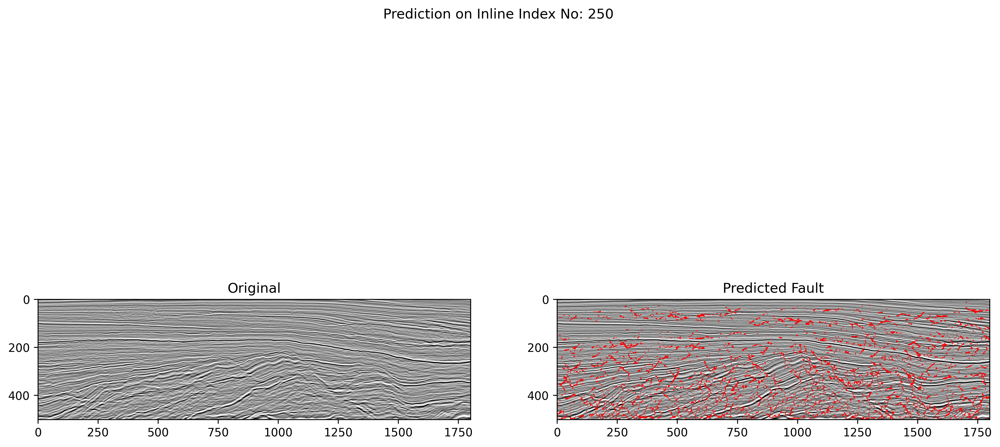

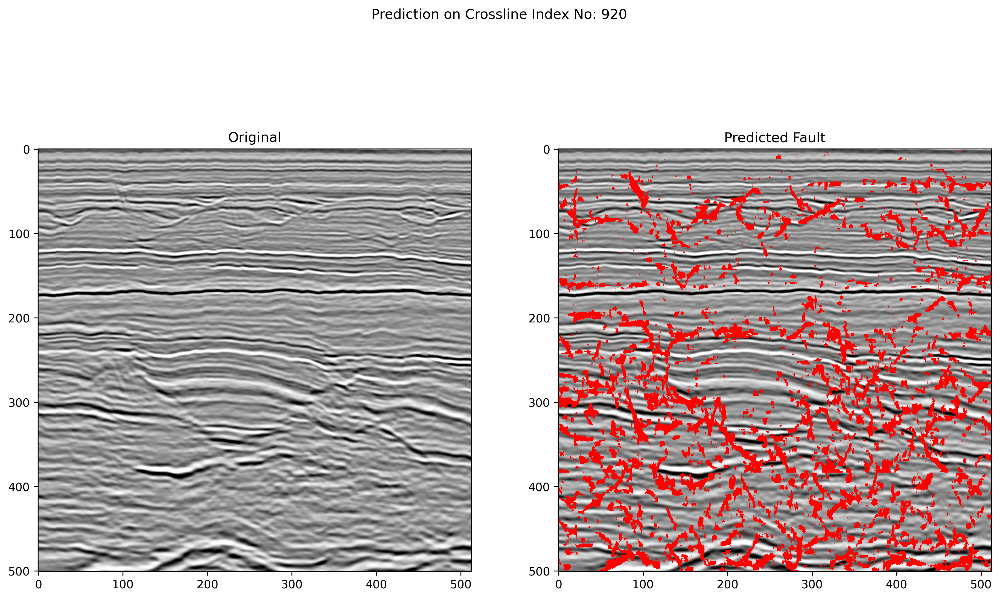

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 18ms/step


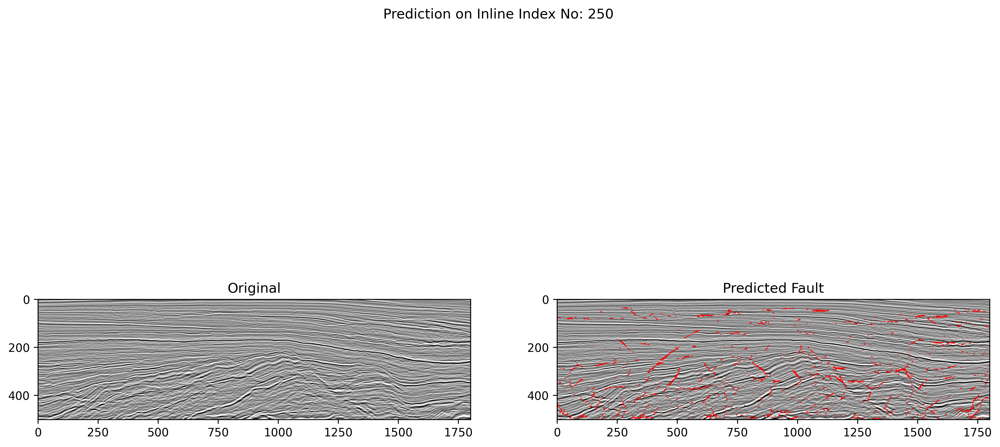

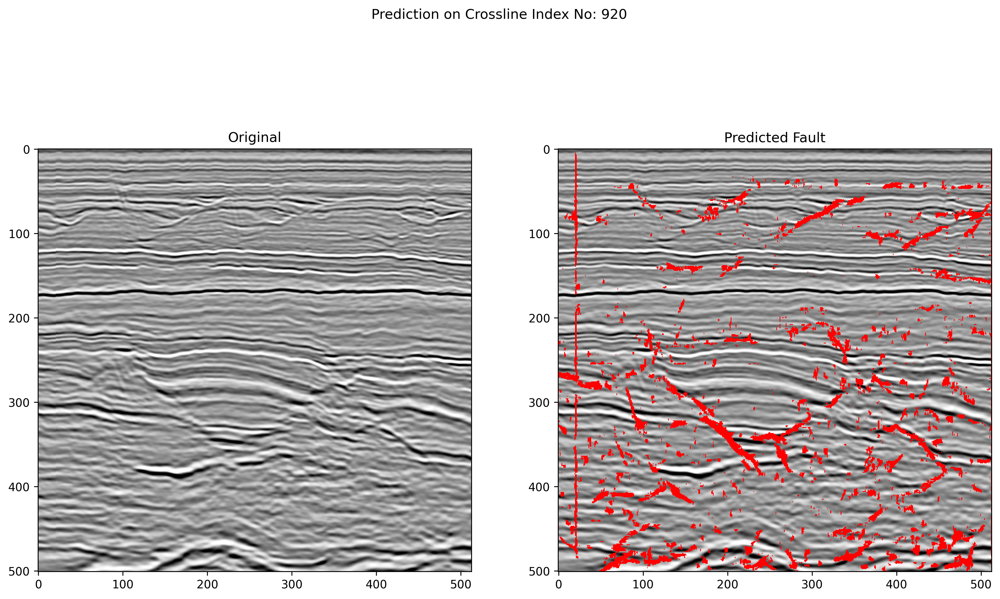

In [ ]:
filename = '/content/drive/MyDrive/UTP_dGB_Documents/data/torosa-seismic/PloverTorosaSubArea_1015-1527_1500-3300_2-4_32bit.sgy'
outname_1 = '/'.join(filename.split('.')[0].split('/')[:-1])+'/Result/'+filename.split('.')[0].split('/')[-1]+'_UNet_VGG_All_Prediction.sgy'
outname_2 = '/'.join(filename.split('.')[0].split('/')[:-1])+'/Result/'+filename.split('.')[0].split('/')[-1]+'_UNet_VGG_11_Prediction.sgy'
seismic = segyio.tools.cube(filename)
seisnorm = normalization(seismic)
# All Layers
prediction_1 = predict_patch(seisnorm, model_unet_vgg_1)
visualize_result(seismic, prediction_1, mode='inline', index=250)
visualize_result(seismic, prediction_1, mode='crossline', index=920)
# export_segy(filename, outname_1, prediction_1)
# 11 Layers
prediction_2 = predict_patch(seisnorm, model_unet_vgg_2)
visualize_result(seismic, prediction_2, mode='inline', index=250)
visualize_result(seismic, prediction_2, mode='crossline', index=920)
# export_segy(filename, outname_2, prediction_2)

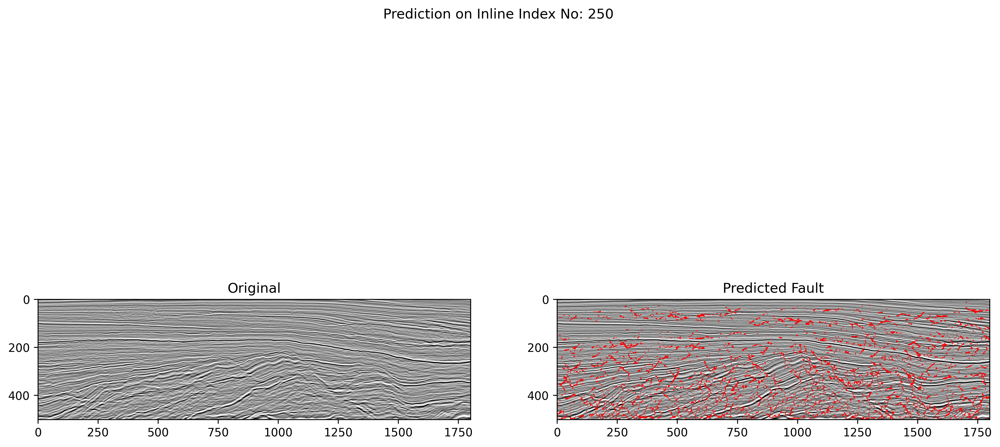

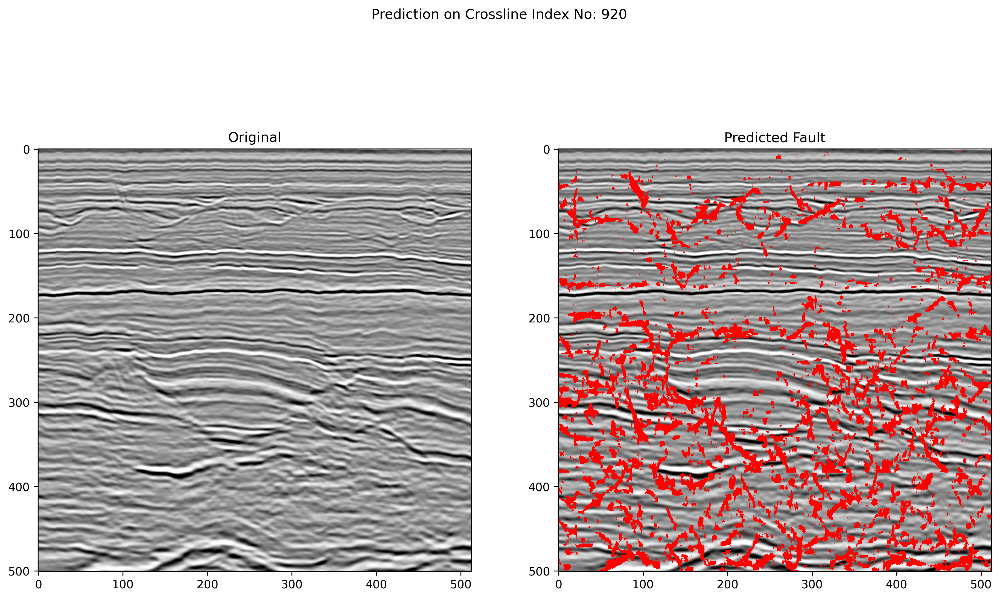

In [29]:
visualize_result(seismic, prediction_1, mode='inline', index=250)
visualize_result(seismic, prediction_1, mode='crossline', index=920)

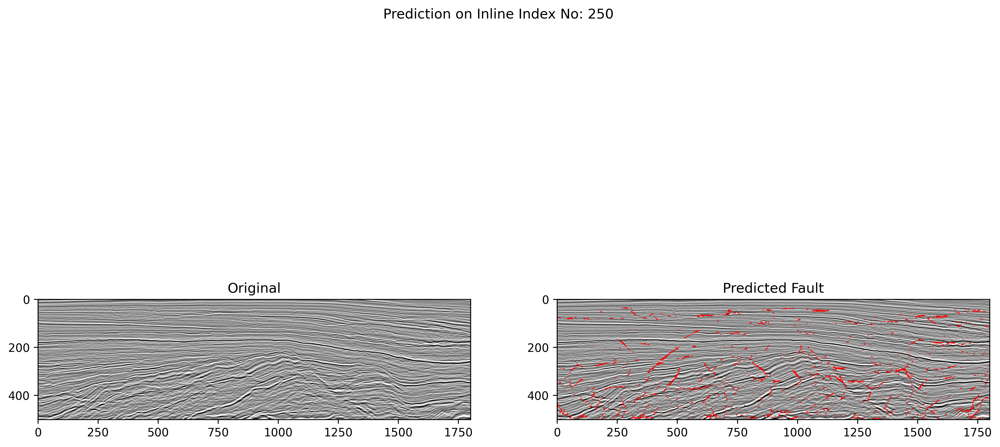

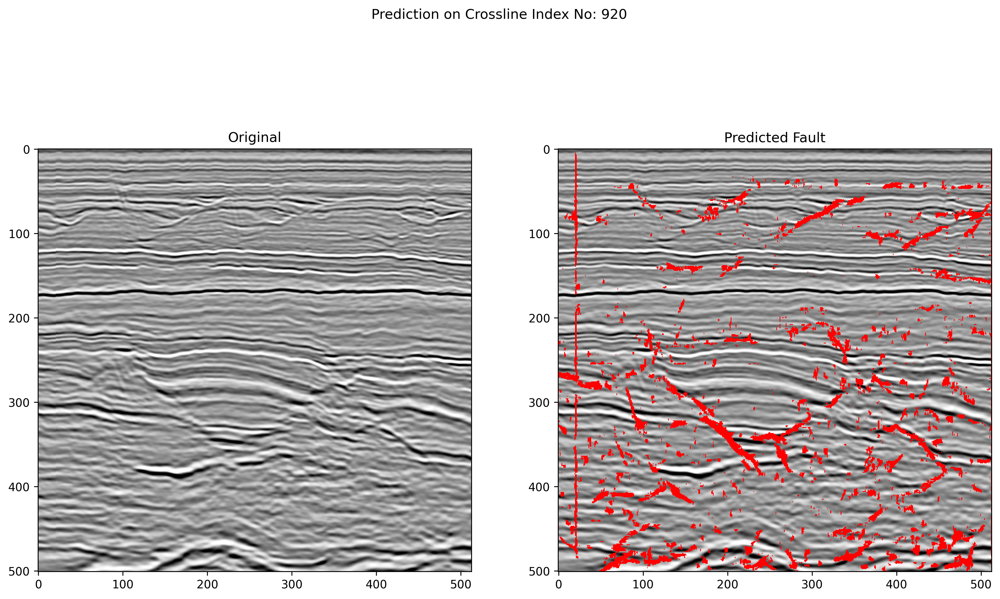

In [30]:
visualize_result(seismic, prediction_2, mode='inline', index=250)
visualize_result(seismic, prediction_2, mode='crossline', index=920)